<a id="section0"></a>

# <font color=red>Notebook 2: Data Analysis</font> 
## This notebok records the data wrangling to generate data appropriate for analysis, and the analytic methods used

### Contents
- [1. Load and process previously generated dataframes](#section1)
- [2. Geographical clustering of US breweries](#section2)
    - [2a. Map the clusters](#section2a)
    - [2b. Assign best beers to clusters based on lat/lg](#section2b)
- [3. Segmenting breweries based on neighborhood (Foursquare) data](#section3)
    - [3a. K-Nearest Neighbors clustering of breweries based on venues](#section3a)     
- [4. Estimating brewery (nighborhood) densities using Foursquare data](#section4)
- [5. Cleanup best beer data](#section5)
- [6. Regression analyses](#section5)


In [2]:
import pandas as pd
import numpy as np
import re
import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sb
import folium
from folium.features import DivIcon
from sklearn import preprocessing
from sklearn import metrics
print('Libraries loaded.')

Libraries loaded.


<a id="section1"></a>

# 1. Load and process previously generated data
In Notebook 1, I gathered the primary data that I would need for this project. First I will load those dataframes and derive a set of dataframes for analysis.

In [353]:
df_usbreweries = pd.read_pickle('BreweryData.pkl')

In [354]:
df_usbreweries.head(3)

,brewery_name,brewery_address,brewery_type,bstate,bzip,blat,blng
0,(405) Brewing Co,"1716 Topeka St, Norman, OK 73069-8224",Micro,OK,73069,35.228649,-97.45629
1,(512) Brewing Co,"407 Radam Ln Ste F200, Austin, TX 78745-1197",Micro,TX,78745,30.207559,-97.79575
2,10 Torr Distilling and Brewing,"490 Mill St, Reno, NV 89502",Micro,NV,89502,39.499862,-119.77497


<a id="section2"></a>

# 2. Reducing geographical data through clustering
Clustering of the breweries based on their latitude/longitude can help identify if there are geographical groups. Group membership can then be used instead of an individyal brewery's lat/lng to see if geographical location is an important predictor of beer quality. 

In [355]:
from sklearn.cluster import KMeans

In [356]:
# The features, X
brewery_features = df_usbreweries[['blat','blng']].copy(deep=True)

In [357]:
Xbrwry = brewery_features
# Normalize, since there's no need to split into train/test
Xbrwry_sc = preprocessing.StandardScaler().fit(Xbrwry).transform(Xbrwry)

In [418]:
maxitrns=10 # So many iterations. NB: doesn't really matter..?
leastK=2 # At least so many K (clusters)
maxK=20 # so many K to consider at most
best_silhouettes = np.zeros(maxitrns) # Store k of best silhouette over all ks for all iterations
silhouette_df = pd.DataFrame({'itrn','K','sil'})
silctr=0 # counter for silhouettes
for itrns in range(0,maxitrns):
    curr_silhouettes = np.zeros(maxK-leastK) 
    for k in range(leastK,maxK):
        clusterer = KMeans(n_clusters=k)
        cluster_labels = clusterer.fit_predict(Xbrwry_sc)
        curr_silhouettes[k-leastK]=metrics.silhouette_score(Xbrwry_sc, cluster_labels)
        silhouette_df.loc[silctr,'itrn']=itrns
        silhouette_df.loc[silctr,'K']=k
        silhouette_df.loc[silctr,'sil']=metrics.silhouette_score(Xbrwry_sc, cluster_labels)  
        silctr=silctr+1
    best_silhouettes[itrns] = curr_silhouettes.argmax()+leastK
print(best_silhouettes)

[13.  4. 13.  4. 13. 13. 13. 13. 13. 13.]


In [420]:
sb.set()
sb.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

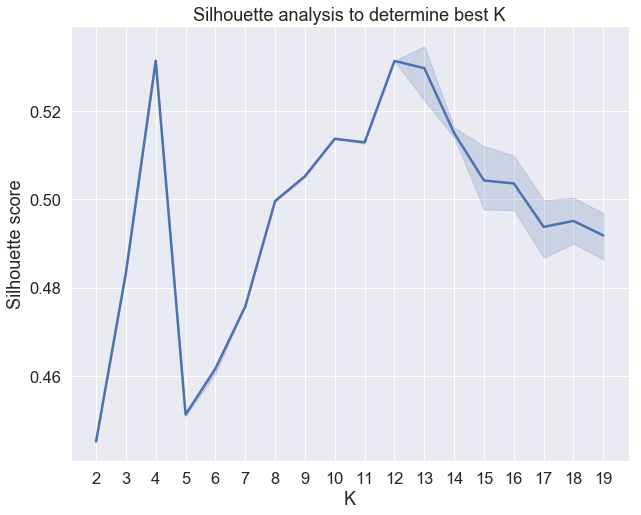

In [421]:
fig1, ax1 = plt.subplots(figsize=(10,8))
p1=sb.lineplot(x='K',y='sil',data=silhouette_df,markers=True)
plt.xlabel("K")
plt.title("Silhouette analysis to determine best K")
plt.ylabel("Silhouette score")
p1.set_xticks(np.arange(2,20));
#sb.despine(right=False, top=False)
plt.show(p1)

#### The above analysis indicates that K=4 is a low number of clusters of the geographical brewery data that has a high silhouette score. We will use this for categorization

In [358]:
bestK=4

In [359]:
# Generate actual clusters
clusterer = KMeans(n_clusters=bestK)
cluster_labels = clusterer.fit_predict(Xbrwry_sc)
cluster_labels_df = pd.DataFrame({'clusterlabel': cluster_labels})
curr_silhouette=metrics.silhouette_score(Xbrwry_sc, cluster_labels)
curr_silhouette

0.5313221950327521

In [360]:
df_usbreweries.shape

(6912, 7)

In [361]:
df_usbreweries['clusterlabel']=list(cluster_labels_df['clusterlabel'].astype(int))

In [362]:
df_usbreweries.head(3)

,brewery_name,brewery_address,brewery_type,bstate,bzip,blat,blng,clusterlabel
0,(405) Brewing Co,"1716 Topeka St, Norman, OK 73069-8224",Micro,OK,73069,35.228649,-97.45629,1
1,(512) Brewing Co,"407 Radam Ln Ste F200, Austin, TX 78745-1197",Micro,TX,78745,30.207559,-97.79575,1
2,10 Torr Distilling and Brewing,"490 Mill St, Reno, NV 89502",Micro,NV,89502,39.499862,-119.77497,2


In [363]:
df_usbreweries.to_pickle('BreweryDataV2.pkl')

<a id="section2a"></a>

## Mapping the clusters

In [33]:
df_usbreweries = pd.read_pickle('BreweryDataV2.pkl')

In [34]:
# US latitude and longitude values
# retrieved from https://gps-coordinates.org/united-states-latitude.php
us_lat = 39.381266
us_lng = -97.922211
cluster_map = folium.Map(location=[us_lat, us_lng], zoom_start=4, min_zoom=4, max_zoom=4)

In [35]:
# Create a color scheme for clusters
bestK=4
x = np.arange(bestK)
colors_array = cm.Dark2(np.linspace(0, 1, len(x)))
colors_array = [matplotlib.colors.rgb2hex(i) for i in colors_array]

In [36]:
# add markers to map
for lat, lng, brwryname, clabel in zip(df_usbreweries['blat'], df_usbreweries['blng'], df_usbreweries['brewery_name'], df_usbreweries['clusterlabel']):
    if not(np.isnan(lat)):
        label = folium.Popup(str(clabel), parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=2,
            popup=label,
            color=colors_array[clabel-1],
            fill=True,
            fill_color=colors_array[clabel-1],
            fill_opacity=0.5,
            parse_html=False).add_to(cluster_map)  

In [37]:
# Get cluster mean coordinates
cluster_mean_coords = df_usbreweries.groupby(['clusterlabel']).mean()
# and add to map
for lat, lng, clabel in zip(cluster_mean_coords['blat'], cluster_mean_coords['blng'], cluster_mean_coords.index):
    folium.map.Marker(
        [lat, lng],
        icon=DivIcon(
        icon_size=(30,30),
        icon_anchor=(0,0),
        html='<div style="font-size: 16pt; color: powderblue; background-color:maroon;"><b>C'+str(clabel)+'</b></div>',
        )
    ).add_to(cluster_map)

In [38]:
cluster_map

<a id="section2b"></a>

### Add these classes to _best beers_

In [364]:
df_bestbeers=pd.read_pickle('BA_bestbeersV1.pkl')

In [365]:
dum = df_bestbeers[['lat','lng']]
# Normalize..
dum = preprocessing.StandardScaler().fit(dum).transform(dum)
KMclusters = clusterer.predict(dum)
df_bestbeers['KMclusters']=KMclusters
df_bestbeers.head(3)

,ba_rank,beer_name,brewery_name,style,abv,ba_score,num_ratings,beer_url,brewery_url,style_url,brewery_address,zips,lat,lng,state,KMclusters
0,1,Kentucky Brunch Brand Stout,Toppling Goliath Brewing Company,American Imperial Stout,12,4.84,745,/beer/profile/23222/78820/,/beer/profile/23222/,/beer/styles/157/,"1600 Prosperity Rd, Decorah, Iowa, 52101",52101,43.272400,-91.723689,IA,3
1,2,Marshmallow Handjee,3 Floyds Brewing Co.,Russian Imperial Stout,15,4.74,1659,/beer/profile/26/42349/,/beer/profile/26/,/beer/styles/84/,"9750 Indiana Pkwy, Munster, Indiana, 46321-4004",46321,41.534786,-87.516571,IN,3
2,3,Barrel-Aged Abraxas,Perennial Artisan Ales,American Imperial Stout,11,4.74,1492,/beer/profile/25888/87246/,/beer/profile/25888/,/beer/styles/157/,"8125 Michigan Ave, Saint Louis, Missouri, 6311...",63111,38.545352,-90.265324,MO,3


In [366]:
df_bestbeers['KMclusters'].value_counts()

3    133
2     53
1     20
0     13
Name: KMclusters, dtype: int64

In [367]:
df_bestbeers.to_pickle('BA_bestbeersV2.pkl')

In [368]:
df_bestbeers[['state','KMclusters']].groupby(['state']).mean()

,KMclusters
state,
AK,0
AR,1
CA,2
CO,2
CT,3
FL,1
GA,1
IA,3
IL,3


In [51]:
sb.set()
sb.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

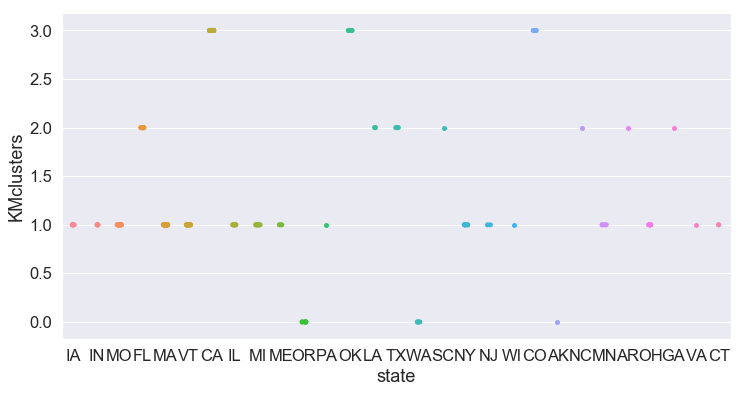

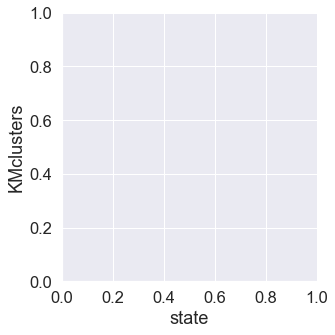

In [60]:
fig2, ax2 = plt.subplots(figsize=(12,6))
p2=sb.catplot(x='state',y='KMclusters',data=df_bestbeers, ax=ax2)

### Takeaway: each state appears to belong to only one cluster. Can eliminate the State var

<a id="section3"></a>

# 3. Segmenting breweries based on venue data

In [369]:
df_bestbeers=pd.read_pickle('BA_bestbeersV2.pkl') # This has cluster information
df_foursquare = pd.read_pickle('Foursquare_data.pkl')

In [370]:
df_bestbeers.head(3)

,ba_rank,beer_name,brewery_name,style,abv,ba_score,num_ratings,beer_url,brewery_url,style_url,brewery_address,zips,lat,lng,state,KMclusters
0,1,Kentucky Brunch Brand Stout,Toppling Goliath Brewing Company,American Imperial Stout,12,4.84,745,/beer/profile/23222/78820/,/beer/profile/23222/,/beer/styles/157/,"1600 Prosperity Rd, Decorah, Iowa, 52101",52101,43.272400,-91.723689,IA,3
1,2,Marshmallow Handjee,3 Floyds Brewing Co.,Russian Imperial Stout,15,4.74,1659,/beer/profile/26/42349/,/beer/profile/26/,/beer/styles/84/,"9750 Indiana Pkwy, Munster, Indiana, 46321-4004",46321,41.534786,-87.516571,IN,3
2,3,Barrel-Aged Abraxas,Perennial Artisan Ales,American Imperial Stout,11,4.74,1492,/beer/profile/25888/87246/,/beer/profile/25888/,/beer/styles/157/,"8125 Michigan Ave, Saint Louis, Missouri, 6311...",63111,38.545352,-90.265324,MO,3


In [371]:
df_foursquare.head(3)

,name,categories,lat,lng,brewery_name
0,Weldwerks,Brewery,40.428093,-104.690591,WeldWerks Brewing Co.
1,The Nerd Store,Comic Shop,40.425072,-104.691416,WeldWerks Brewing Co.
2,Patrick's Irish Pub,Bar,40.423478,-104.691038,WeldWerks Brewing Co.


In [372]:
# How many categories?
len(df_foursquare['categories'].unique())

237

#### This dataset has 237 unique categories, comparable to the ~330 categories in the manhattan exercise. Manhattan had ~40 neighborhoods, and we have ~70 breweries, so we can be confident that we have sufficent data for segmentation

In [373]:
# brewery names
breweries4segmentation = pd.DataFrame(df_foursquare['brewery_name'].copy(deep=True))

In [374]:
# dummy variable to store one-hot encodings of venues
dum = pd.get_dummies(df_foursquare['categories'])

In [375]:
breweries4segmentation.shape

(1187, 1)

In [376]:
dum.shape

(1187, 237)

In [377]:
# shapes look good, now concatenate
breweries4segmentation=pd.concat([breweries4segmentation,dum],axis=1)
breweries4segmentation.shape

(1187, 238)

In [378]:
breweries4segmentation.head(2)

,brewery_name,Accessories Store,Airport,American Restaurant,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,...,Vegetarian / Vegan Restaurant,Video Store,Vietnamese Restaurant,Vineyard,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Yoga Studio
0,WeldWerks Brewing Co.,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,WeldWerks Brewing Co.,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### That looks appropriate.. 

In [379]:
# Collapse across breweries
df_breweries4seg = breweries4segmentation.groupby(['brewery_name']).mean().reset_index()

In [380]:
df_breweries4seg.shape

(70, 238)

In [381]:
# Remove Brewery since those are correlated
brewery_column = pd.Series(list(df_breweries4seg.columns))
brewery_column = list(brewery_column.loc[brewery_column.str.contains('Brew')])[0]
brewery_column
df_breweries4seg.drop(columns=[brewery_column],inplace=True)
df_breweries4seg.shape

(70, 237)

#### We now have one-hot encoded venues for all breweries ...on to segmentation

<a id="section3a"></a>

### KMeans for clustering breweries based on venues

In [382]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

In [383]:
Xsegment = df_breweries4seg.drop('brewery_name',1)

In [384]:
Xsegment.shape

(70, 236)

In [385]:
# Normalize, since there's no need to split into train/test
Xsegment_sc = preprocessing.StandardScaler().fit(Xsegment).transform(Xsegment)
Xsegment_sc

array([[-0.12038585, -0.12038585, -0.60452331, ..., -0.12038585,
        -0.2773501 , -0.21160368],
       [-0.12038585, -0.12038585, -0.60452331, ..., -0.12038585,
        -0.2773501 , -0.21160368],
       [-0.12038585, -0.12038585, -0.60452331, ..., -0.12038585,
        -0.2773501 , -0.21160368],
       ...,
       [-0.12038585, -0.12038585, -0.60452331, ..., -0.12038585,
        -0.2773501 , -0.21160368],
       [-0.12038585, -0.12038585, -0.60452331, ..., -0.12038585,
        -0.2773501 , -0.21160368],
       [-0.12038585, -0.12038585,  0.47052556, ..., -0.12038585,
        -0.2773501 , -0.21160368]])

In [422]:
maxitrns=100 # So many iterations. NB: doesn't really matter..?
leastK=2 # At least so many K (clusters)
maxK=50 # so many K to consider at most
best_silhouettes = np.zeros(maxitrns) # Store k of best silhouette over all ks for all iterations
silhouette_df = pd.DataFrame({'itrn','K','sil'})
silctr=0 # counter for silhouettes
for itrns in range(0,maxitrns):
    curr_silhouettes = np.zeros(maxK-leastK) 
    for k in range(leastK,maxK):
        clusterer = KMeans(n_clusters=k)
        cluster_labels = clusterer.fit_predict(Xsegment_sc)
        curr_silhouettes[k-leastK]=metrics.silhouette_score(Xsegment_sc, cluster_labels)
        silhouette_df.loc[silctr,'itrn']=itrns
        silhouette_df.loc[silctr,'K']=k
        silhouette_df.loc[silctr,'sil']=metrics.silhouette_score(Xsegment_sc, cluster_labels)  
        silctr=silctr+1
    best_silhouettes[itrns] = curr_silhouettes.argmax()+leastK
print(best_silhouettes)

[2. 2. 3. 2. 2. 2. 2. 2. 3. 2. 2. 2. 2. 2. 2. 3. 2. 3. 2. 2. 2. 3. 2. 2.
 3. 2. 2. 2. 2. 2. 2. 2. 2. 2. 5. 2. 6. 2. 2. 2. 3. 2. 2. 2. 3. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 4. 4. 2. 2. 3. 2. 2. 2. 3. 2. 3. 2. 2. 2. 4. 2.
 2. 2. 2. 2. 4. 2. 2. 2. 2. 2. 2. 3. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 3. 2. 2.]


In [387]:
sb.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})

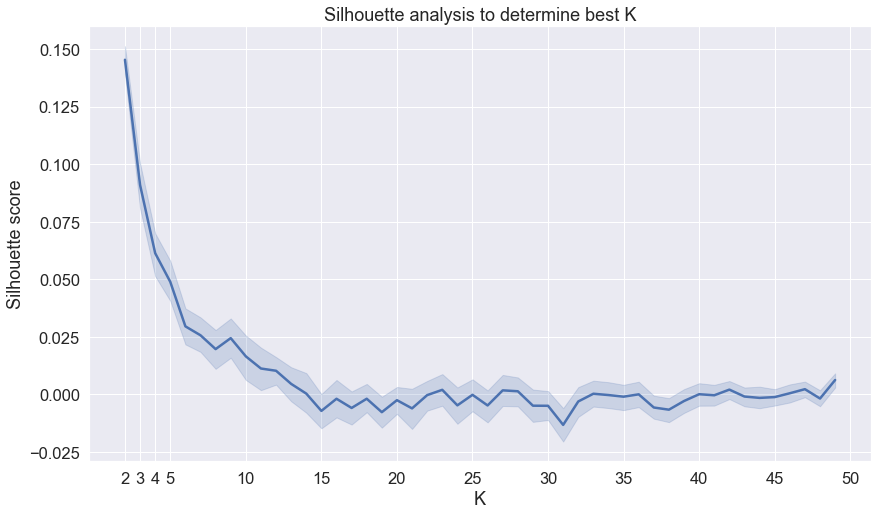

In [423]:
fig3, ax3 = plt.subplots(figsize=(14,8))
p3=sb.lineplot(x='K',y='sil',data=silhouette_df,markers=True)
plt.xlabel("K")
plt.title("Silhouette analysis to determine best K")
plt.ylabel("Silhouette score")
p3.set_xticks(np.append([2, 3, 4], np.arange(5,51,5)))#np.arange(0,70,5));
#sb.despine(right=False, top=False)
plt.show(p3)

In [424]:
segbestK=2
# Generate actual clusters
segclusterer = KMeans(n_clusters=segbestK)
segcluster_labels = segclusterer.fit_predict(Xsegment_sc)
segcluster_labels_df = pd.DataFrame({'segclusterlabel': segcluster_labels})
segcurr_silhouette=metrics.silhouette_score(Xsegment_sc, segcluster_labels)
segcurr_silhouette

0.17452116111793567

In [425]:
segcluster_labels_df['segclusterlabel'].value_counts()

0    69
1     1
Name: segclusterlabel, dtype: int64

In [426]:
df_breweries4seg.loc[segcluster_labels_df['segclusterlabel']>0,'brewery_name']

51    Prairie Artisan Ales
Name: brewery_name, dtype: object

In [427]:
df_bestbeers.loc[df_bestbeers['brewery_name']=='Prairie Artisan Ales',:]

,ba_rank,beer_name,brewery_name,style,abv,ba_score,num_ratings,beer_url,brewery_url,style_url,brewery_address,zips,lat,lng,state,KMclusters
46,52,Bourbon Paradise,Prairie Artisan Ales,American Imperial Stout,15.9,4.61,476,/beer/profile/30356/314813/,/beer/profile/30356/,/beer/styles/157/,"223 N Main St, Tulsa, Oklahoma, 74103",74103,36.159017,-95.994055,OK,2
63,70,Pirate Paradise,Prairie Artisan Ales,American Imperial Stout,13,4.60,257,/beer/profile/30356/247386/,/beer/profile/30356/,/beer/styles/157/,"223 N Main St, Tulsa, Oklahoma, 74103",74103,36.159017,-95.994055,OK,2
115,128,Pirate Bomb!,Prairie Artisan Ales,American Imperial Stout,15,4.52,2301,/beer/profile/30356/102340/,/beer/profile/30356/,/beer/styles/157/,"223 N Main St, Tulsa, Oklahoma, 74103",74103,36.159017,-95.994055,OK,2
138,158,Bomb!,Prairie Artisan Ales,American Imperial Stout,13,4.50,6390,/beer/profile/30356/94350/,/beer/profile/30356/,/beer/styles/157/,"223 N Main St, Tulsa, Oklahoma, 74103",74103,36.159017,-95.994055,OK,2
170,192,Barrel Aged Bomb!,Prairie Artisan Ales,American Imperial Stout,11.2,4.49,1187,/beer/profile/30356/139521/,/beer/profile/30356/,/beer/styles/157/,"223 N Main St, Tulsa, Oklahoma, 74103",74103,36.159017,-95.994055,OK,2
172,195,Okie Paradise,Prairie Artisan Ales,American Strong Ale,12,4.60,61,/beer/profile/30356/271939/,/beer/profile/30356/,/beer/styles/78/,"223 N Main St, Tulsa, Oklahoma, 74103",74103,36.159017,-95.994055,OK,2
181,204,Barrel Aged Christmas Bomb!,Prairie Artisan Ales,American Imperial Stout,13,4.52,164,/beer/profile/30356/258280/,/beer/profile/30356/,/beer/styles/157/,"223 N Main St, Tulsa, Oklahoma, 74103",74103,36.159017,-95.994055,OK,2
184,207,Apple Brandy Barrel Noir,Prairie Artisan Ales,American Imperial Stout,12,4.48,1644,/beer/profile/30356/149331/,/beer/profile/30356/,/beer/styles/157/,"223 N Main St, Tulsa, Oklahoma, 74103",74103,36.159017,-95.994055,OK,2


<a id="section3b"></a>

### Clustering with DBSCAN, hierarchical DBSCAN

In [393]:
from sklearn.cluster import DBSCAN

In [398]:
db = DBSCAN(eps=0.9, min_samples=20).fit_predict(Xsegment_sc)

In [399]:
db

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1])

###  Various parameters values all result in lack of clustering

In [400]:
import hdbscan

In [401]:
hdb = hdbscan.HDBSCAN(min_cluster_size=3,allow_single_cluster=True)
hdb_pred = hdb.fit(Xsegment_sc)

In [402]:
hdb_pred

HDBSCAN(algorithm='best', allow_single_cluster=True, alpha=1.0,
    approx_min_span_tree=True, cluster_selection_method='eom',
    core_dist_n_jobs=4, gen_min_span_tree=False, leaf_size=40,
    match_reference_implementation=False, memory=Memory(location=None),
    metric='euclidean', min_cluster_size=3, min_samples=None, p=None,
    prediction_data=False)

In [403]:
c=hdb_pred.labels_
c

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  0, -1,  0, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  0, -1, -1, -1, -1,
       -1, -1])

### SUMMARY: clustering of this data seems impossible!

<a id="section4"></a>

# Using Foursquare data to estimate brewery densities as a potential explanatory variable

In [428]:
df_foursquare = pd.read_pickle('Foursquare_data.pkl')

In [432]:
# List of al breweries
breweries = pd.DataFrame({'brewery_name': df_foursquare['brewery_name'].unique()})

In [431]:
# Count how many breweries around a given brewery
numbreweries=[]
for br in breweries['brewery_name']:
    dum = df_foursquare.loc[df_foursquare['brewery_name']==br,'categories']
    numbreweries.append(dum.str.contains('Brew').sum())
len(numbreweries)

70

In [433]:
x=pd.DataFrame({'numbreweries':numbreweries})

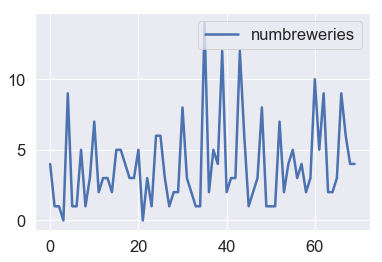

In [434]:
sb.lineplot(data=x)

### Add these numbers back to best beers

In [450]:
df_bestbeers = pd.read_pickle('BA_bestbeersV2.pkl')

In [451]:
# Add a new column
df_bestbeers['numbreweries4sq']=0

In [455]:
for i in breweries.index:
    brwry=breweries.loc[i,'brewery_name']
    numbrwry=x.loc[i,'numbreweries']
    if numbrwry>0:
        numbrwry=numbrwry-1
    df_bestbeers.loc[df_bestbeers['brewery_name']==brwry,'numbreweries4sq']=numbrwry
df_bestbeers.head(3)

,ba_rank,beer_name,brewery_name,style,abv,ba_score,num_ratings,beer_url,brewery_url,style_url,brewery_address,zips,lat,lng,state,KMclusters,numbreweries4sq
0,1,Kentucky Brunch Brand Stout,Toppling Goliath Brewing Company,American Imperial Stout,12,4.84,745,/beer/profile/23222/78820/,/beer/profile/23222/,/beer/styles/157/,"1600 Prosperity Rd, Decorah, Iowa, 52101",52101,43.272400,-91.723689,IA,3,1
1,2,Marshmallow Handjee,3 Floyds Brewing Co.,Russian Imperial Stout,15,4.74,1659,/beer/profile/26/42349/,/beer/profile/26/,/beer/styles/84/,"9750 Indiana Pkwy, Munster, Indiana, 46321-4004",46321,41.534786,-87.516571,IN,3,1
2,3,Barrel-Aged Abraxas,Perennial Artisan Ales,American Imperial Stout,11,4.74,1492,/beer/profile/25888/87246/,/beer/profile/25888/,/beer/styles/157/,"8125 Michigan Ave, Saint Louis, Missouri, 6311...",63111,38.545352,-90.265324,MO,3,3


In [456]:
df_bestbeers['numbreweries4sq'].value_counts()

2     71
0     50
1     36
3     15
4     14
8     12
7      6
5      5
11     4
13     3
6      2
9      1
Name: numbreweries4sq, dtype: int64

In [457]:
df_bestbeers.to_pickle('BA_bestbeersV3.pkl')

# Machine learning to predict BA beer scores

### See if there is any relation between style and abv

In [3]:
df_bestbeers = pd.read_pickle('BA_bestbeersV3.pkl')

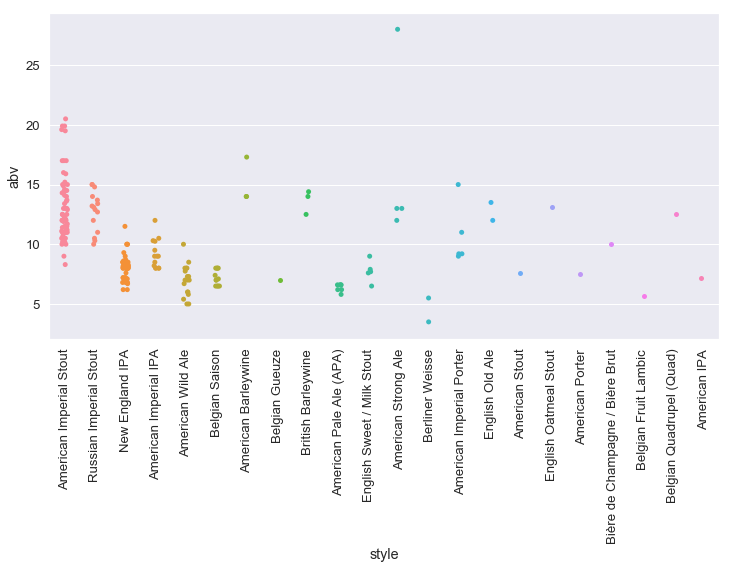

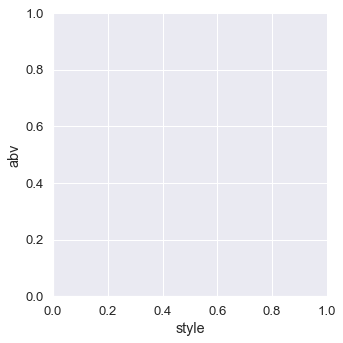

In [459]:
sb.set_context("notebook", font_scale=1.2, rc={"lines.linewidth": 2.5})
fig3, ax3 = plt.subplots(figsize=(12,6))
p3=sb.catplot(x='style',y='abv', data=df_bestbeers, ax=ax3)
#p3.set_xticklabels(rotation=90)
[plt.setp(ax3.get_xticklabels(), rotation=90) for ax in p3.axes.flat]
plt.show()

### Reduce styles – aggregate those with very few entries

In [4]:
# Make a new var to hold all styles 
allstyles = df_bestbeers['style'].value_counts()
allstyles

American Imperial Stout            65
New England IPA                    56
American Wild Ale                  18
Russian Imperial Stout             15
American Imperial IPA              14
Belgian Saison                     12
American Pale Ale (APA)             7
American Imperial Porter            5
English Sweet / Milk Stout          5
American Strong Ale                 4
British Barleywine                  3
American Barleywine                 3
English Old Ale                     2
Berliner Weisse                     2
American Porter                     1
Belgian Fruit Lambic                1
American IPA                        1
English Oatmeal Stout               1
Belgian Quadrupel (Quad)            1
Bière de Champagne / Bière Brut     1
Belgian Gueuze                      1
American Stout                      1
Name: style, dtype: int64

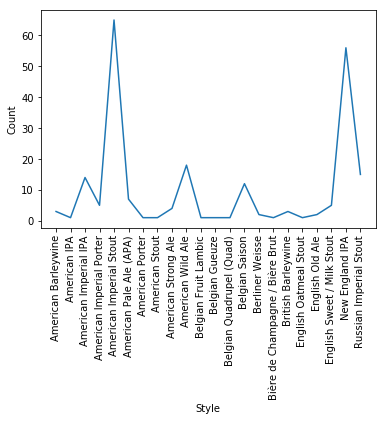

In [5]:
# Look at distribution of styles 
ax = sb.lineplot(x=allstyles.index, y=allstyles.values)
plt.xlabel('Style')
plt.ylabel('Count')
for item in ax.get_xticklabels():
    item.set_rotation(90)

In [6]:
# Make a modified list of styles
modstyles = pd.DataFrame({'styles': df_bestbeers['style'].copy(deep=True)})

In [7]:
# These styles to change:
aggr_styles = allstyles.loc[allstyles.values<=10].index

In [8]:
# Change rare styles to 'other'
for a in aggr_styles:
    modstyles.loc[modstyles['styles']==a,'styles'] = 'other'

In [9]:
print(modstyles.shape)
modstyles.tail(3)

(219, 1)


,styles
220,other
221,American Wild Ale
222,New England IPA


In [10]:
# Save to df
df_bestbeers['modstyles']=modstyles

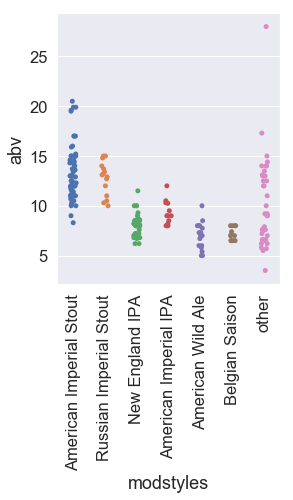

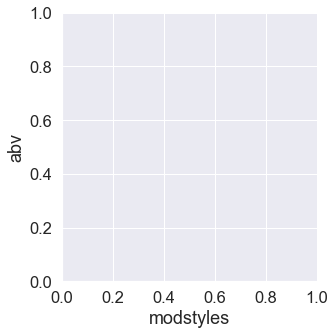

In [11]:
sb.set()
sb.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
fig4, ax4 = plt.subplots(figsize=(4,5))
p4=sb.catplot(x='modstyles',y='abv', data=df_bestbeers, ax=ax4)
[plt.setp(ax4.get_xticklabels(), rotation=90) for ax in p4.axes.flat]
plt.show()

In [12]:
df_bestbeers.to_pickle('BA_bestbeersV4.pkl')

### NB: relation between styles and ABV suggests ridge regression would be best here

# Regression 
Ridge regression is indicated

In [13]:
df_bestbeers = pd.read_pickle('BA_bestbeersV4.pkl')
df_bestbeers.head(3)

,ba_rank,beer_name,brewery_name,style,abv,ba_score,num_ratings,beer_url,brewery_url,style_url,brewery_address,zips,lat,lng,state,KMclusters,numbreweries4sq,modstyles
0,1,Kentucky Brunch Brand Stout,Toppling Goliath Brewing Company,American Imperial Stout,12,4.84,745,/beer/profile/23222/78820/,/beer/profile/23222/,/beer/styles/157/,"1600 Prosperity Rd, Decorah, Iowa, 52101",52101,43.272400,-91.723689,IA,3,1,American Imperial Stout
1,2,Marshmallow Handjee,3 Floyds Brewing Co.,Russian Imperial Stout,15,4.74,1659,/beer/profile/26/42349/,/beer/profile/26/,/beer/styles/84/,"9750 Indiana Pkwy, Munster, Indiana, 46321-4004",46321,41.534786,-87.516571,IN,3,1,Russian Imperial Stout
2,3,Barrel-Aged Abraxas,Perennial Artisan Ales,American Imperial Stout,11,4.74,1492,/beer/profile/25888/87246/,/beer/profile/25888/,/beer/styles/157/,"8125 Michigan Ave, Saint Louis, Missouri, 6311...",63111,38.545352,-90.265324,MO,3,3,American Imperial Stout


In [14]:
Features = df_bestbeers[['abv','num_ratings','numbreweries4sq']].copy(deep=True)

In [15]:
# Make dummy variables for clusters and (mod)styles
dum_KMclusters = pd.get_dummies(df_bestbeers['KMclusters'],prefix='KMC',prefix_sep='')
dum_modstyles = pd.get_dummies(df_bestbeers['modstyles'],prefix='Style',prefix_sep='_')

In [16]:
Features = pd.concat([Features, dum_KMclusters, dum_modstyles], axis=1, copy=True)

In [17]:
X = np.asanyarray(Features)

In [18]:
y = np.asanyarray(pd.DataFrame(df_bestbeers['ba_score']))

### We have X and y! On to regression

In [626]:
from sklearn import preprocessing
from sklearn import metrics
from sklearn.model_selection import train_test_split  
import scipy

In [594]:
# Test-train split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0) 

# Normalize
X_train = preprocessing.StandardScaler().fit(X_train).transform(X_train)
X_test = preprocessing.StandardScaler().fit(X_test).transform(X_test)

y_train = preprocessing.StandardScaler().fit(y_train).transform(y_train)
y_test = preprocessing.StandardScaler().fit(y_test).transform(y_test)


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


### Simple linear

In [595]:
from sklearn.linear_model import LinearRegression 
regressor = LinearRegression()  
regressor.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [596]:
yhat = regressor.predict(X_test)

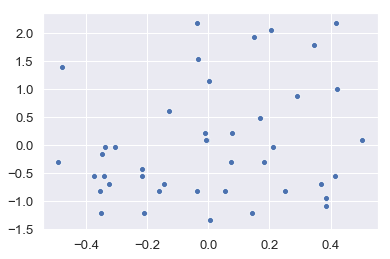

In [621]:
sb.scatterplot(yhat.flatten(),y_test.flatten())

In [600]:
rslt = pd.DataFrame({'yhat':yhat.flatten(), 'y_test':y_test.flatten()})

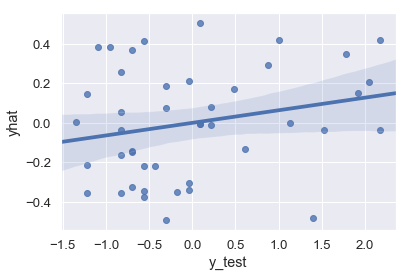

In [601]:
sb.regplot(x='y_test', y='yhat', data=rslt)

In [587]:
np.sqrt(np.mean((yhat-y_test)**2))

0.9740335680657343

In [623]:
print('RMS: {}'.format(metrics.mean_squared_error(y_test,yhat)))

RMS: 0.948247104719534


In [628]:
scipy.stats.pearsonr(y_test,yhat)

(array([0.23152684]), array([0.13048448]))

In [588]:
regressor.coef_

array([[ 0.0337578 ,  0.03325327, -0.14371799,  0.01539334,  0.03963604,
        -0.03922244,  0.00837761, -0.02092552,  0.14838497, -0.0103952 ,
         0.01370937,  0.01179085, -0.08141921, -0.11609149]])

In [611]:
regr_coefs = pd.DataFrame({'variable':Features.columns, 'coefficient':regressor.coef_.flatten()})
regr_coefs.sort_values(by='coefficient')

,variable,coefficient
2,numbreweries4sq,-0.143718
13,Style_other,-0.116091
12,Style_Russian Imperial Stout,-0.081419
5,KMC2,-0.039222
7,Style_American Imperial IPA,-0.020926
9,Style_American Wild Ale,-0.010395
6,KMC3,0.008378
11,Style_New England IPA,0.011791
10,Style_Belgian Saison,0.013709
3,KMC0,0.015393


### Ridge regression

In [630]:
clf = Ridge(alpha=10)
clf.fit(X_train, y_train) 
yhat = clf.predict(X_test)

In [631]:
np.sqrt(np.mean((yhat-y_test)**2))

0.9719199527248586

In [632]:
clf.score(X_test,y_test)

0.055371605495308396

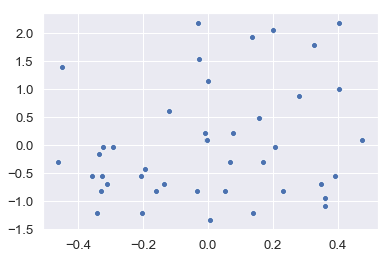

In [633]:
sb.scatterplot(yhat.flatten(),y_test.flatten())

In [634]:
scipy.stats.pearsonr(y_test,yhat)

(array([0.23657824]), array([0.12206922]))

### Lasso

In [635]:
from sklearn import linear_model
reg = linear_model.Lasso(alpha=0.1)

In [638]:
reg.fit(X_train,y_train)

Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

In [639]:
yhat=reg.predict(X_test)

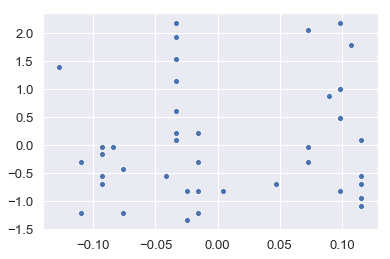

In [642]:
sb.scatterplot(yhat.flatten(),y_test.flatten())

In [644]:
scipy.stats.pearsonr(y_test.flatten(),yhat.flatten())

(0.12025416133395868, 0.4368402606252515)

In [645]:
reg.score(X_test,y_test)

0.012594591821352695

## Try without Styles

In [18]:
df_bestbeers = pd.read_pickle('BA_bestbeersV4.pkl')

In [19]:
# Make dummy variables for clusters and (mod)styles
dum_KMclusters = pd.get_dummies(df_bestbeers['KMclusters'],prefix='KMC',prefix_sep='')
dum_modstyles = pd.get_dummies(df_bestbeers['modstyles'],prefix='Style',prefix_sep='_')

In [20]:
Features2 = df_bestbeers[['abv','num_ratings','numbreweries4sq']].copy(deep=True)
Features2 = pd.concat([Features2, dum_KMclusters], axis=1, copy=True)

In [21]:
X2 = np.asanyarray(Features2)
y2 = np.asanyarray(pd.DataFrame(df_bestbeers['ba_score']))

In [22]:
from sklearn import preprocessing
from sklearn import metrics
from sklearn.model_selection import train_test_split  
import scipy

In [24]:
# Test-train split
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2) 

# Normalize
X2_train = preprocessing.StandardScaler().fit(X2_train).transform(X2_train)
X2_test = preprocessing.StandardScaler().fit(X2_test).transform(X2_test)

y2_train = preprocessing.StandardScaler().fit(y2_train).transform(y2_train)
y2_test = preprocessing.StandardScaler().fit(y2_test).transform(y2_test)


/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [25]:
from sklearn.linear_model import LinearRegression 
regressor = LinearRegression()  
regressor.fit(X2_train, y2_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [27]:
yhat2 = regressor.predict(X2_test)

In [28]:
rslt2 = pd.DataFrame({'yhat':yhat2.flatten(), 'y_test':y2_test.flatten()})

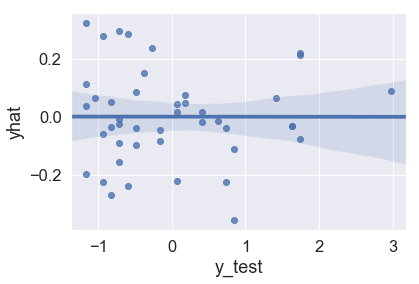

In [30]:
sb.regplot(x='y_test', y='yhat', data=rslt2)

In [31]:
scipy.stats.pearsonr(y2_test,yhat2)

(array([-0.00112958]), array([0.99419379]))

## Final linear

In [21]:
from sklearn import preprocessing
from sklearn import metrics
from sklearn.model_selection import train_test_split  
import scipy

In [22]:
from sklearn.linear_model import LinearRegression 
regressor = LinearRegression()  
regressor.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [23]:
ypred = regressor.predict(X)

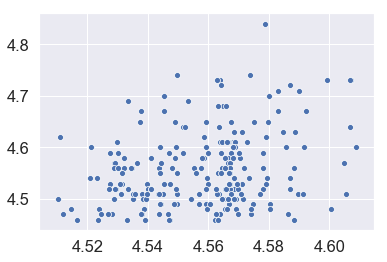

In [24]:
sb.scatterplot(ypred.flatten(),y.flatten())

In [26]:
rslt = pd.DataFrame({'yhat':ypred.flatten(), 'y_test':y.flatten()})

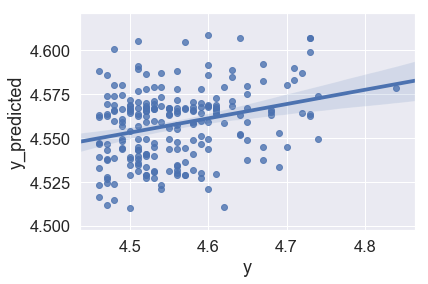

In [34]:
sb.regplot(x='y_test', y='yhat', data=rslt)
plt.xlabel('y')
plt.ylabel('y_predicted')
plt.show()

In [36]:
print('RMS: {}'.format(np.sqrt(metrics.mean_squared_error(y,ypred))))

RMS: 0.06938281883967315


In [31]:
scipy.stats.pearsonr(y,ypred)

(array([0.28487633]), array([1.86312938e-05]))

In [32]:
regr_coefs = pd.DataFrame({'variable':Features.columns, 'coefficient':regressor.coef_.flatten()})
regr_coefs.sort_values(by='coefficient')

,variable,coefficient
12,Style_Russian Imperial Stout,-0.023100
13,Style_other,-0.019990
5,KMC2,-0.016110
7,Style_American Imperial IPA,-0.009991
3,KMC0,-0.008799
2,numbreweries4sq,-0.001897
1,num_ratings,0.000002
0,abv,0.002439
6,KMC3,0.002733
11,Style_New England IPA,0.010867


## Conclusion: ordinary least-square regression seems good enough but has a very low overall score.